In [33]:
# Import Libraries
from gurobi import *
import math
import matplotlib.pyplot as plt
import pandas as pd
import geopandas as gpd
import geopy.distance
from collections import defaultdict
from shapely.geometry import Point, LineString


In [62]:
# Load Polygons Data
# polygons = gpd.read_file('/home/fillipe/Projects/gettin/pandana/data/CONTINENTE/BGRI11_CONT.shp', dtype={'BGRI11': str})



# Load Distance Matrix - GEOMETRY is Coming as STRING
distanceMatrix = pd.read_csv('/home/fillipe/Projects/gettin/optimization/data_gettin/carta_educativa_loures/distance_matrix/distance-matrix-schools-1107.csv', dtype={'destination':str})
distanceMatrix = distanceMatrix.drop(columns=['geometry'])
# distanceMatrix = distanceMatrix[distanceMatrix['real_distance'].notna()]
distanceMatrix['real_distance'] = distanceMatrix['real_distance'].fillna(0)

In [63]:
# Load Projection Data
population_projection = pd.read_csv('/home/fillipe/Projects/gettin/optimization/data_gettin/carta_educativa_loures/df_alunos_subseccao_2040_Loures_final.csv', dtype={'Unnamed: 0':str})
population_projection.rename(columns={'Unnamed: 0':'BGRI'}, inplace=True)
population_projection.index = population_projection['BGRI']
population_projection = population_projection.drop(columns=['BGRI'])
# Aggregate 2 and 3 cicles
population_projection['proj_sum_2_3'] = population_projection.loc[:,"2_CEB_Proj_2040"]+population_projection.loc[:,"3_CEB_Proj_2040"]

In [64]:
# For Loures -> We need to correct the number of BGRI (demand) for CAOP 2018

# First Limitation on distanceMatrix
distanceMatrix = distanceMatrix[(distanceMatrix.destination.isin(population_projection.index))] # projection is based on 2018

In [78]:
# Load School (Ofer) Data
# schools = gpd.read_file('./data_gettin/escolasourem/gdf_escolas_Ourem2019_capacidades.shp')
schools = gpd.read_file('/home/fillipe/Projects/gettin/optimization/data_gettin/carta_educativa_loures/escolas_loures/gdf_escolas_2019_elegiveis_Loures.shp')
# schools = gpd.read_file('./data_gettin/escolas_ourem_antigo/gdf_escolas_Ourem2019_capacidades.shp')
# schools.Capacidade = schools.Capacidade.astype(float)
schools['Capacida_2_3'] = schools.Capacida_2+schools.Capacida_3
schools['Alunos_2CE_3CE'] = schools.Alunos_2CE+schools.Alunos_3CE

## Ploting Data and Manipulation


In [66]:
# # Load Data for Roads and Ocupation

gdf_freguesias_CAOP2018 = gpd.read_file('/home/fillipe/Projects/gettin/optimization/data_gettin/carta_educativa_loures/loures_subseccoes_BGRI_CAOP_2018/gdf_BGRI_2011_Loures_Final.shp')
gdf_freguesias_CAOP2018 = gdf_freguesias_CAOP2018[gdf_freguesias_CAOP2018['DTMN11']=='1107']
gpd_COS_municipio = gpd.read_file('/home/fillipe/Projects/gettin/optimization/data_gettin/carta_educativa_loures/gdf_COS/gdf_COS_2015_Loures.shp')
gdf_open_street2019_municipio = gpd.read_file('/home/fillipe/Projects/gettin/optimization/data_gettin/carta_educativa_loures/gdf_open_street2019/gdf_open_street2019_Loures.shp')

In [67]:
# Used for Loures, beacuse of CAOP 2018 redesing
selectedPolygon = gpd.read_file('/home/fillipe/Projects/gettin/optimization/data_gettin/carta_educativa_loures/loures_subseccoes_BGRI_CAOP_2018/gdf_BGRI_2011_Loures_Final.shp')
selectedPolygon = gdf_freguesias_CAOP2018[gdf_freguesias_CAOP2018['DTMN11']=='1107']

# Used for Loures, to generate better plotting based on macro regions
loures_macro_regions = gpd.read_file('/home/fillipe/Projects/gettin/optimization/data_gettin/carta_educativa_loures/macro_regioes_shp/Areas_Territoriais2.shp')

In [68]:
loures_macro_regions.head()

,Tipologia,geometry
0,Norte_Rural,"POLYGON ((-86584.202 -80287.034, -86572.412 -8..."
1,Norte_Urbano,"POLYGON ((-91709.212 -87395.961, -91706.582 -8..."
2,Oriental,"POLYGON ((-82634.474 -89275.648, -82595.715 -8..."


In [69]:
# Limit the map to the Macro Region
gdf_Loures_Region = gpd.overlay(loures_macro_regions[loures_macro_regions['Tipologia']=='Norte_Rural'], selectedPolygon, how='intersection')

selectedPolygon = gdf_Loures_Region

<AxesSubplot:>

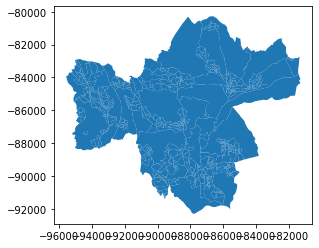

In [70]:
gdf_Loures_Region.plot()

In [71]:
# Limit schools to the selected region
schools = gpd.overlay(schools, gdf_Loures_Region, how='intersection') # REMEMBER TO RESTART THE SCHOOLS

In [77]:
schools[['Nome_Insta', 'FID_x']].head(6)

,Nome_Insta,FID_x
0,Escola Básica da Bemposta,5
1,Escola Básica de Bucelas,6
2,Escola Básica de Bucelas,114
3,Escola Básica de Bucelas,115
4,Escola Básica de Lousa,62
5,Escola Básica de Lousa,84


In [74]:
distanceMatrix.head(3)

,Unnamed: 0,origin,destination,real_distance,Nome_Escol,FID_x,Capacidade,Capacida_1,Capacida_2,Capacida_3,Capacida_4
2,2,0,11071600545,5625.228,Escola Básica Fernando de Bulhões (JI),1,100.0,0.0,0.0,0.0,0.0
3,3,0,11071600544,8014.445,Escola Básica Fernando de Bulhões (JI),1,100.0,0.0,0.0,0.0,0.0
4,4,0,11071400518,5862.927,Escola Básica Fernando de Bulhões (JI),1,100.0,0.0,0.0,0.0,0.0


In [44]:
# Limit the distance Matrix to the selected region
distanceMatrix = distanceMatrix[(distanceMatrix.destination.isin(gdf_Loures_Region.BGRI11)) & (distanceMatrix.origin.isin(schools.FID_x))]

In [45]:
# Limit the projection to the analized BGRI's
population_projection = population_projection[population_projection.index.isin(gdf_Loures_Region.BGRI11)]

<AxesSubplot:>

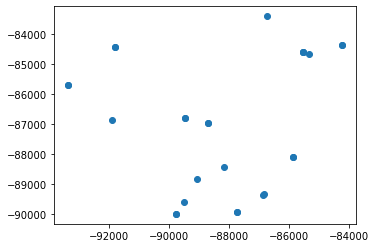

In [47]:
schools.plot()

## Define Globals

In [48]:
# Define some school globals to make capacity calculation easier 
schoolSelection = 'Capacidade'
projectionSelection = 'Pre_escolar_Proj_2040'
studentsActualEnrolledSelection = 'Alunos_EPE'
schoolsPre = schools[schools[schoolSelection]>0]

# Used in Demand and Capacity
selectecProjection = population_projection.loc[:,projectionSelection]
selectedSchoolCapacity = schoolsPre.loc[ : , schoolSelection ]

## Decision Variables

In [49]:
# -------------- Decision Variables -------------- #

# School demand per BGRI
demand = dict(zip(population_projection.index, selectecProjection))


# Plant capacity in thousands of units
capacity = dict(zip(schoolsPre.index, selectedSchoolCapacity))

# Model
m = Model("capacitaded_location_schools")

# School open decision variables: open[p] == 1 if plant p is open.
open = m.addVars(list(capacity.keys()), vtype=GRB.BINARY, name="open")


In [50]:
# Transport DestinationsAndCosts Structure to make model ULTRA FAST!!!

transportCosts = []
notExistingBGRI = []

distanceMatrix_TD = list(zip(distanceMatrix.FID_x,distanceMatrix.destination))
distanceMatrix_structure = dict(zip(distanceMatrix_TD,distanceMatrix.real_distance.values))

for bgri in demand:
    tempList = []
    for e in capacity:
        try:
            tempList.append(distanceMatrix_structure[(e,bgri)] * demand[bgri])
#             tempList.append(distanceMatrix_structure[(e,bgri)])
#             tempList.append(distanceMatrix[distanceMatrix['origin']==e][distanceMatrix['to']==bgri].real_distance.values[0])
        except:
            notExistingBGRI.append(bgri)
    transportCosts.append(tempList)

In [51]:
# Create Transport Decision Variables
# transport = m.addVars(list(demand.keys()) ,list(capacity.keys()),name="trans")
transport = m.addVars(list(demand.keys()), list(capacity.keys()), obj=transportCosts, name="trans")


In [52]:
m.update()

In [53]:

# The objective is to minimize the total fixed and variable costs
m.modelSense = GRB.MINIMIZE

# Capacity constraints
m.addConstrs(
    (transport.sum('*',p) <= capacity[p] for p in list(capacity.keys())),
    "Capacity")


# Demand constraints
m.addConstrs(
    (transport.sum(w) == demand[w] for w in list(demand.keys())),
    "Demand")

# Save model
m.write('facility_Pre.lp')

# Use barrier to solve root relaxation
m.Params.method = 2

# Solve
m.optimize()

Changed value of parameter method to 2
   Prev: -1  Min: -1  Max: 5  Default: -1
Gurobi Optimizer version 9.1.1 build v9.1.1rc0 (linux64)
Thread count: 8 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 640 rows, 8778 columns and 17528 nonzeros
Model fingerprint: 0x816c96db
Variable types: 8764 continuous, 14 integer (14 binary)
Coefficient statistics:
  Matrix range     [1e+00, 1e+00]
  Objective range  [2e+02, 3e+05]
  Bounds range     [1e+00, 1e+00]
  RHS range        [1e-01, 8e+01]
Found heuristic solution: objective 7004587.9938
Presolve removed 182 rows and 2562 columns
Presolve time: 0.02s
Presolved: 458 rows, 6216 columns, 12432 nonzeros
Variable types: 6216 continuous, 0 integer (0 binary)
Root barrier log...

Ordering time: 0.00s

Barrier statistics:
 AA' NZ     : 6.216e+03
 Factor NZ  : 7.143e+03 (roughly 3 MBytes of memory)
 Factor Ops : 1.192e+05 (less than 1 second per iteration)
 Threads    : 1

                  Objective                

In [54]:

# Print solution
print('\nTOTAL COSTS: %g' % m.objVal)
print('SOLUTION:')
listOfCapacities = []
listOfSchoolAndBgri = []
enrolledStudentsCount = []
for p in capacity:
    
    if open[p].x < 0.99:
        print('School %s open' % p)
        tempList = []
        for w in demand:
            if transport[w,p].x > 0:
                print('  Transport %g units from BGRI %s' % \
                      (transport[w,p].x, w))
                # Create a list of School and BGRI and the distance to school
                listOfSchoolAndBgri.append([w,p,distanceMatrix_structure[p,w], distanceMatrix_structure[p,w]*transport[w,p].x])
                tempList.append(transport[w,p].x)
        
        print('SUM of School %d : %f' % (p, sum(tempList)))
        
        # To create a DF with school and number of students
        enrolledStudentsCount.append([p,sum(tempList)])
        # To verify if the correct number of students are enrolled
        listOfCapacities.append(sum(tempList))
            
    else:
        print('School is %s closed!' % p)
pd_SchoolAndBgri = pd.DataFrame(listOfSchoolAndBgri, columns=['BGRI','school','Unitary_real_distance','pondered_real_distance'])
pd_SchoolAndStudents = pd.DataFrame(enrolledStudentsCount, columns=['school', 'students'])

 from BGRI 11070500309
  Transport 0.237243 units from BGRI 11070500319
  Transport 0.237243 units from BGRI 11070500325
  Transport 0.118622 units from BGRI 11070500326
  Transport 0.237243 units from BGRI 11070500401
  Transport 0.355865 units from BGRI 11070500402
  Transport 0.237243 units from BGRI 11070500405
  Transport 0.118622 units from BGRI 11070500414
  Transport 0.237243 units from BGRI 11070500415
  Transport 0.237243 units from BGRI 11070500416
  Transport 0.237243 units from BGRI 11070500419
  Transport 0.355865 units from BGRI 11070500420
  Transport 0.405412 units from BGRI 11070700103
  Transport 0.405412 units from BGRI 11070700604
  Transport 0.405412 units from BGRI 11070700903
  Transport 0.424016 units from BGRI 11070800202
  Transport 0.141339 units from BGRI 11070800203
  Transport 0.282677 units from BGRI 11070800207
  Transport 0.282677 units from BGRI 11070800208
  Transport 0.282677 units from BGRI 11070800321
  Transport 0.132596 units from BGRI 110714001

In [55]:
# Create the metrics from the pd with alocated demands and real_distance
schoolsPre['dist_media'] = pd_SchoolAndBgri[['school','Unitary_real_distance']].groupby('school').mean()
schoolsPre['dist_min'] = pd_SchoolAndBgri[['school','Unitary_real_distance']].groupby('school').min()
schoolsPre['dist_max'] = pd_SchoolAndBgri[['school','Unitary_real_distance']].groupby('school').max()
schoolsPre['dist_STDeviation'] = pd_SchoolAndBgri[['school','Unitary_real_distance']].groupby('school').std()


# Add to the selected schools how many students are alocated
schoolsPre = pd.merge(schoolsPre, pd_SchoolAndStudents[['students']], how='left', left_on=[schoolsPre.index], right_on=[pd_SchoolAndStudents.school])


/home/fillipe/anaconda3/envs/gurobi/lib/python3.8/site-packages/geopandas/geodataframe.py:853: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super(GeoDataFrame, self).__setitem__(key, value)


In [56]:
# clean after merge
schoolsPre = schoolsPre.rename(columns={'key_0':'school'})
schoolsPre.index = schoolsPre.school

In [57]:
prePolygonLines = pd.merge(selectedPolygon, pd_SchoolAndBgri, how='left', left_on=[selectedPolygon.BGRI11], right_on=[pd_SchoolAndBgri.BGRI])
# Some BGRI are missing, or the demand is zero
prePolygonLines = prePolygonLines[prePolygonLines['school'].notna()]
prePolygonLines.school = prePolygonLines.school.astype(int)
prePolygonLines.geometry = prePolygonLines.centroid

# Get List of lines
listOfLines = []

for e in prePolygonLines.iterrows():
    pointSchool = [schoolsPre[schoolsPre.index==e[1].school].geometry.x.values[0], schoolsPre[schoolsPre.index==e[1].school].geometry.y.values[0]]
    line = LineString([[e[1].geometry.x, e[1].geometry.y],pointSchool])
    listOfLines.append(line)
prePolygonLines['line'] = listOfLines

# Lines
teste = prePolygonLines
teste.geometry = teste.line

<AxesSubplot:>

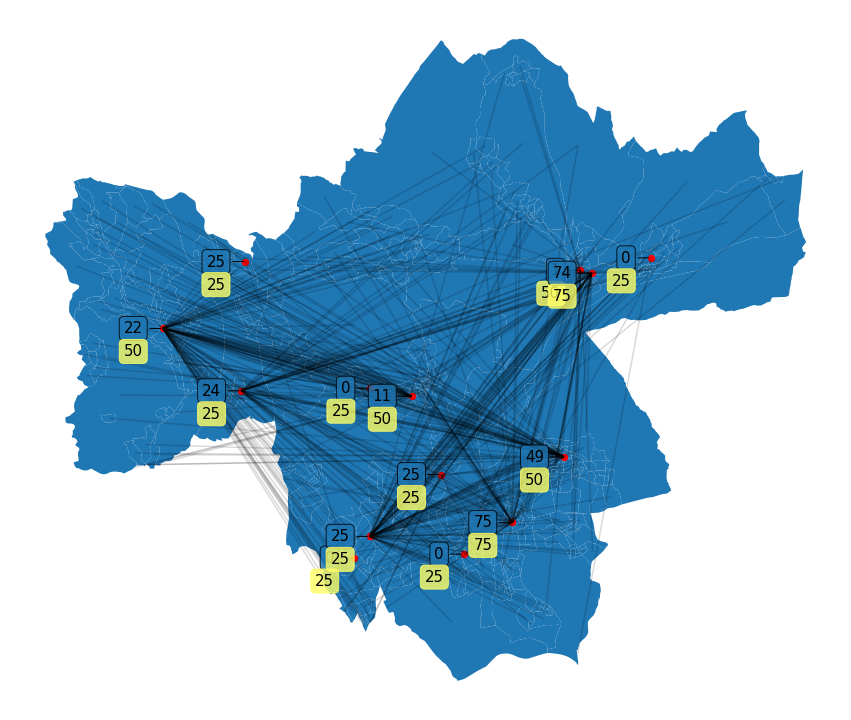

In [58]:
# PLOT

fig, ax = plt.subplots(figsize=(15,15))
teste.plot(ax=ax, alpha=0.15, color='black')

selectedPolygon.plot(ax=ax)
ax.set_axis_off()

for idx, row in schoolsPre.iterrows():
    offset = {'x':-20, 'y':0}
    
    ax.annotate(int(row['students']), xy=(row['geometry'].x,row['geometry'].y),
             xytext=(offset['x'], offset['y']), textcoords='offset points',
             size=15, ha='right', va="center",zorder=200,
             bbox=dict(boxstyle="round", alpha=0.8),
             arrowprops=dict(arrowstyle="-", alpha=1));
    ax.annotate(int(row['Capacidade']), xy=(row['geometry'].x,row['geometry'].y),
             xytext=(offset['x'], offset['y']-23), textcoords='offset points',
             size=15, ha='right', va="center",zorder=200,
             bbox=dict(boxstyle="round", alpha=0.8, color='#FFFF66')
             );
    


schoolsPre.plot(ax=ax, markersize=40, color='red', marker='o', label='centroid')

In [59]:

# _-------------_ Uso do Solo: Categorias _-----------_


#recebe RGB em dicionários de float e devolve o hexadecimal correspondente
def rgb_to_hex (diccionario_cores): 
    dict_novo = {}
    for nome in diccionario_cores:
        dict_novo [nome] = '#%02x%02x%02x'%tuple(int(i * 255) for i in diccionario_cores[nome])
    return(dict_novo)
#define RGB para cada tipo de ocupação de solo 
colors_cos = {'Territórios artificializados': (0.8, 0, 0),
              'Agricultura': (0.9, 0.7, 0.03), 
              'Pastagens': (0.96, 0.93, 0.03),
              'Sistemas agro-florestais': (0.85, 0.6, 0),
              'Florestas': (0, 0.5, 0), 
              'Matos': (0, 0.7, 0),
              'Espaços descobertos ou com vegetação esparsa': (0.9, 0.9, 0.5),
              'Zonas húmidas': (0.9, 0.9, 0.5), 
              'Corpos de água': (0.3, 0.6, 1)}
colors_cos_hexa = rgb_to_hex(colors_cos)


# _-------------_ Estradas: Categorias _-----------_

motorway = ['motorway', 'motorway_link']
primary = ['primary', 'trunk', 'secondary']
n_mapear = ['cycleway', 'steps', 'track','track_grade1','track_grade2',
            'track_grade3','track_grade4','track_grade5','pedestrian',
            'footway', 'unclassified','path']

dict_temp = {}
for nome in gdf_open_street2019_municipio.fclass.unique(): 
    if nome in motorway:
        dict_temp [nome] = list((0.4,6))
    elif nome in primary: 
        dict_temp [nome] = list((0.3,4))
    elif nome in n_mapear:
        dict_temp [nome] = list((0.2,1))
    else: 
        dict_temp [nome] = list((0.3,2))


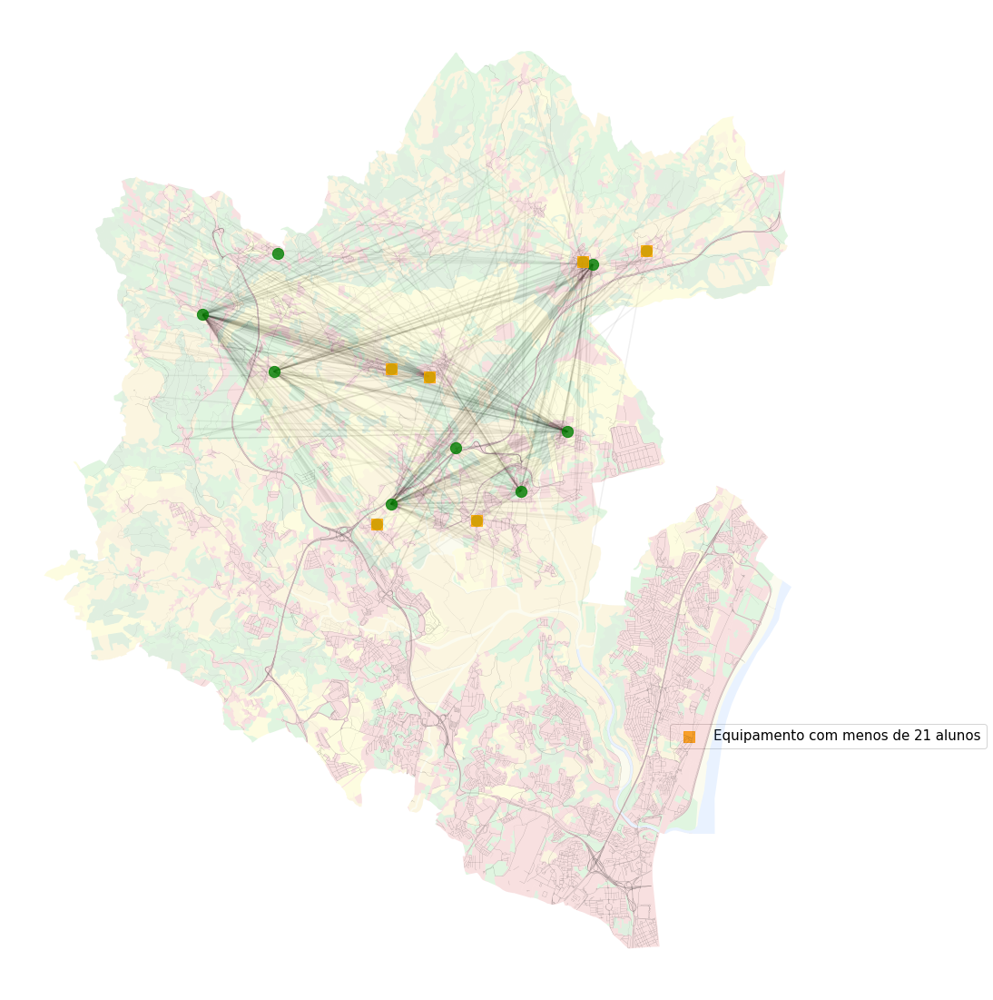

In [60]:
# _-------------_ Criação do Gráfico _-----------_
fig, ax = plt.subplots(figsize=(20, 20))

#Plota os limites das freguesias 
# gdf_freguesias_CAOP2018.plot(ax=ax,
#                         facecolor='None', edgecolor='black', linewidth=0.4, zorder=20)


#Plota ocupação e uso de solo por categoria, em função do esquema de cores definido em colors_cos_hexa
for categoria, data in gpd_COS_municipio.groupby('Megaclasse'):
    # Define the color for each group using the dictionary
    color = colors_cos_hexa[categoria]
    # Plot each group using the color defined above
    data.plot(color=color, ax=ax, alpha=0.12, zorder=10)

#Plota a rede de estradas, em função da linewidths e alphas definido em dict_temp 
for ctype, data in gdf_open_street2019_municipio.groupby('fclass'):
    alpha = dict_temp[ctype][0]
    linewidth = dict_temp[ctype][0]
    data.plot(color = 'black', ax=ax, alpha=alpha, 
              linewidth=linewidth, zorder=15)
    
teste.plot(ax=ax, alpha=0.06, color='black')


ax.set_axis_off()

markersize = 150
# If the School has critic mass
schoolsPre.plot(ax=ax, markersize=markersize, color='green', marker='o', alpha=0.8,zorder=50)
# IF the school is a closing Candidate
schoolsPre[schoolsPre['students']<=22].plot(ax=ax, markersize=markersize, color='#FFA500', marker='s', label='Equipamento com menos de 21 alunos', alpha=0.8, zorder=60)
plt.legend(prop={'size':15}, bbox_to_anchor = (1.2,0.28))


for idx, row in schoolsPre.iterrows():
    offset = {'x':-20, 'y':0}
    
    
    # Offset Correction
    # offset = {'x':45, 'y':-15} if idx==38 else offset
    # offset = {'x':45, 'y':-15} if idx==36 else offset
    # offset = {'x':45, 'y':-15} if idx==27 else offset
    # offset = {'x':45, 'y':35} if idx==13 else offset
    # offset = {'x':0, 'y':-30} if idx==22 else offset
    # offset = {'x':45, 'y':15} if idx==20 else offset # 2_3
    # offset = {'x':45, 'y':35} if idx==21 else offset # 2_3
    # offset = {'x':20, 'y':-35} if idx==10 else offset # 2_3
    # offset = {'x':-20, 'y':20} if idx==32 else offset # 2_3
    # ax.annotate(int(row['students']), xy=(row['geometry'].x,row['geometry'].y),
    #          xytext=(offset['x'], offset['y']), textcoords='offset points',
    #          size=10, ha='right', va="center",zorder=200,
    #          bbox=dict(boxstyle="round", alpha=0.8),
    #          arrowprops=dict(arrowstyle="-", alpha=1));
    # ax.annotate(int(row[schoolSelection]), xy=(row['geometry'].x,row['geometry'].y),
    #          xytext=(offset['x'], offset['y']-23), textcoords='offset points',
    #          size=10, ha='right', va="center",zorder=200,
    #          bbox=dict(boxstyle="round", alpha=0.8, color='#FFFF66')
    #          );
    

# 1000 is the magic number
# schoolsPre.plot(ax=ax, markersize=150, color='green', marker='o', label='centroid', alpha=0.8, zorder=1000)